# PROJET 6: Classifiez automatiquement des biens de consommation

### Contexte

- L’entreprise "Place de marché”, souhaite lancer une marketplace e-commerce. Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

- Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

- Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.

#### PARTIE 1 : Données "TEXTE"

#### Importation des données 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gensim

In [2]:
df = pd.read_csv("DF_projet6.csv")
df

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >.

#### Afficher les données 

In [3]:
df.tail(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."


In [4]:
df.sample(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
661,8c90f3ca64ea1a8ce104c3c3f5fc173f,2015-12-31 09:19:31 +0000,http://www.flipkart.com/divine-gifts-artificia...,Divine Gifts & Artificial Jewellery Shanker Bl...,"[""Home Decor & Festive Needs >> Table Decor & ...",SHIEA33PFVZWGR3Q,350.0,320.0,8c90f3ca64ea1a8ce104c3c3f5fc173f.jpg,False,Buy Divine Gifts & Artificial Jewellery Shanke...,No rating available,No rating available,Divine Gifts & Artificial Jewellery,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
405,a231459c1562ee1117e95a61128820b7,2015-12-01 06:13:00 +0000,http://www.flipkart.com/denver-cool-honour-com...,"Denver Cool,Honour Combo Set","[""Beauty and Personal Care >> Fragrances >> De...",CAGEBTJBTNGGDZQZ,390.0,350.0,a231459c1562ee1117e95a61128820b7.jpg,False,"Flipkart.com: Buy Denver Cool,Honour Combo Set...",No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Number of ..."
566,ac209ee3c602efed4ff093854a4ade06,2016-01-07 05:50:25 +0000,http://www.flipkart.com/maxima-19883bmli-swaro...,Maxima 19883BMLI Swarovski Analog Watch - For...,"[""Watches >> Wrist Watches >> Maxima Wrist Wat...",WATDE9NFPB9TBVSK,995.0,995.0,ac209ee3c602efed4ff093854a4ade06.jpg,True,Maxima 19883BMLI Swarovski Analog Watch - For...,4.3,4.3,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
1024,7fd3f7b35e8b4a66432c974c8cb5c46d,2016-03-03 06:06:42 +0000,http://www.flipkart.com/print-shapes-doraemon-...,PRINT SHAPES doraemon Laptop Skin with Mouse p...,"[""Computers >> Laptop Accessories >> Computer ...",LACEGEZBVNG5HZEX,999.0,329.0,7fd3f7b35e8b4a66432c974c8cb5c46d.jpg,False,Specifications of PRINT SHAPES doraemon Laptop...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
246,ea42376c9c52752d9d01bba12eb2999b,2015-12-01 12:40:44 +0000,http://www.flipkart.com/peacock-kadhai-3-8-l/p...,Peacock Kadhai 3.8 L,"[""Kitchen & Dining >> Cookware >> Pots & Pans ...",PTPEDAU5YYUG6HXN,1155.0,1155.0,ea42376c9c52752d9d01bba12eb2999b.jpg,False,Buy Peacock Kadhai 3.8 L for Rs.1155 online. P...,No rating available,No rating available,Peacock,"{""product_specification""=>[{""key""=>""Pan Type"",..."


In [5]:
df.shape

(1050, 15)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

- ### les colonnes des données 

In [7]:
df.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [8]:
df.nunique()

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

- ### Détection des valeurs Manquantes

In [9]:
df.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

<Axes: >

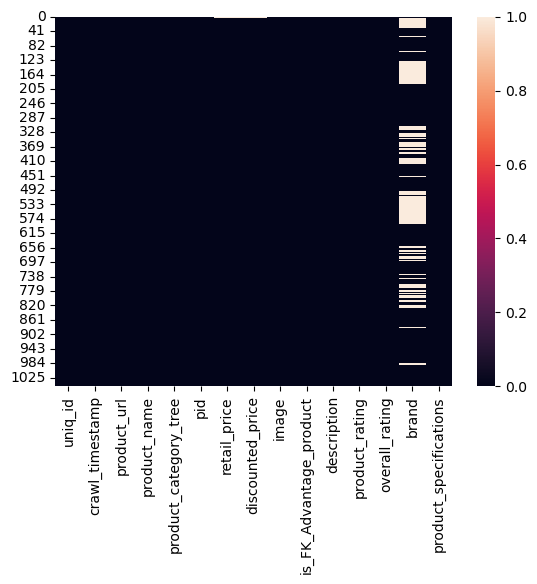

In [10]:
sns.heatmap(df.isna())

- #### Statistiques des données 

In [11]:
df.describe()

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


### Nettoyage catégories

In [12]:
df["product_category_tree"].value_counts().sum()

1050

In [13]:
df["product_category_tree"].nunique()

642

In [14]:
df["product_category_tree"]

0       ["Home Furnishing >> Curtains & Accessories >>...
1       ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
2       ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
3       ["Home Furnishing >> Bed Linen >> Bedsheets >>...
4       ["Home Furnishing >> Bed Linen >> Bedsheets >>...
                              ...                        
1045    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1046    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1047    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1048    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1049    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
Name: product_category_tree, Length: 1050, dtype: object

- #### Extraire les catégories 

In [15]:
#Traitement des catégories
def split_categories(category, level):
    '''Fonction qui affiche les '''
    category = category.split('["')[1].split('"]')[0]
    cat = category.split(' >> ')
    if(len(cat)) < 3:
        cat = [cat[0], cat[1], 'None']
        if(len(cat))<2:
            cat = [cat[0], 'None', 'None']
    return cat[level]

def split_categories_1(category):
    return split_categories(category,0)
def split_categories_2(category):
    return split_categories(category,1)
def split_categories_3(category):
    return split_categories(category,2)

def detail_categories(DF):
    DF['categ_1'] = DF['product_category_tree'].apply(split_categories_1)
    DF['categ_2'] = DF['product_category_tree'].apply(split_categories_2)
    DF['categ_3'] = DF['product_category_tree'].apply(split_categories_3)
    return DF.drop(['product_category_tree'], axis=1)

In [16]:
df = detail_categories(df)
df.head(4)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,categ_1,categ_2,categ_3
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets


#### feature engineering 

In [17]:
df = df.drop(columns=[
    'crawl_timestamp',
    'product_url',
    'pid',
    'retail_price',
    'discounted_price',
    'is_FK_Advantage_product',
    'product_rating',
    'overall_rating',
    'product_specifications',
])

df.head(3)

,uniq_id,product_name,image,description,brand,categ_1,categ_2,categ_3
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance,Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas,Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa,Baby Care,Baby Bath & Skin,Baby Bath Towels


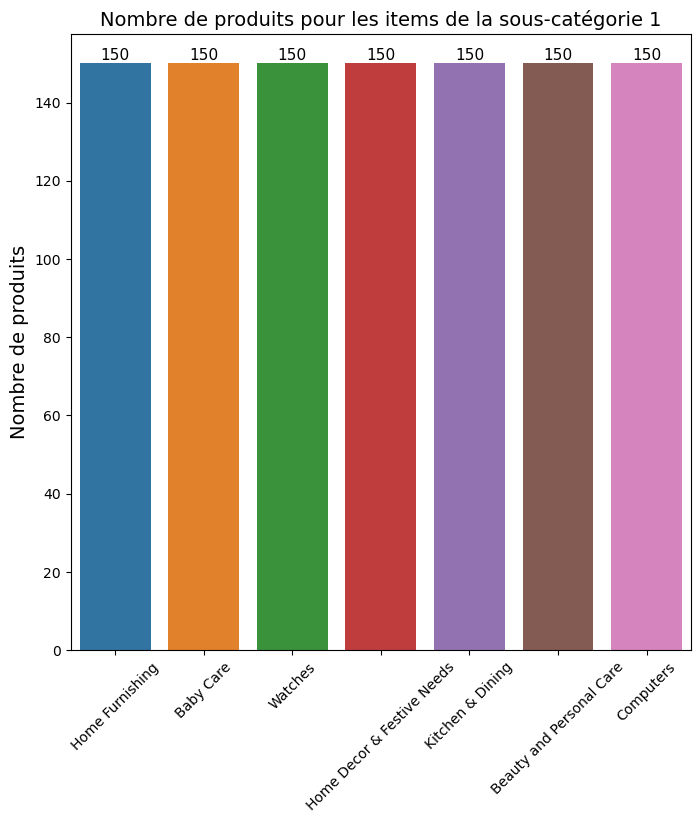

In [18]:
#le comptage de la sous catégorie 1
plt.figure(figsize=(8, 8))
    
plt.xticks(rotation=45)

val = df["categ_1"].value_counts()
val = pd.DataFrame(val)

sns.barplot(x=val.index, y=val["categ_1"])

plt.ylabel("Nombre de produits", size=14)
plt.title('Nombre de produits pour les items de la sous-catégorie 1', size = 14)

for i, v in enumerate(val["categ_1"].values):
    plt.text(i, v+1, v, color='black', ha='center', size=11)

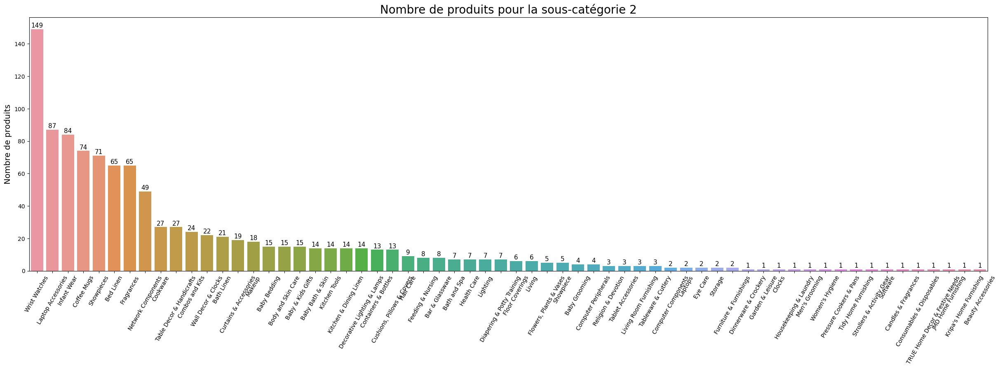

In [19]:
#le comptage de la sous catégorie 2
plt.figure(figsize=(30, 8))
    
plt.xticks(rotation=60)

val = df["categ_2"].value_counts()
val = pd.DataFrame(val)

sns.barplot(x=val.index, y=val["categ_2"])

plt.ylabel("Nombre de produits", size=14)
plt.title("Nombre de produits pour la sous-catégorie 2", size=20)

for i, v in enumerate(val["categ_2"].values):
    plt.text(i, v+1, v, color='black', ha='center', size=11)

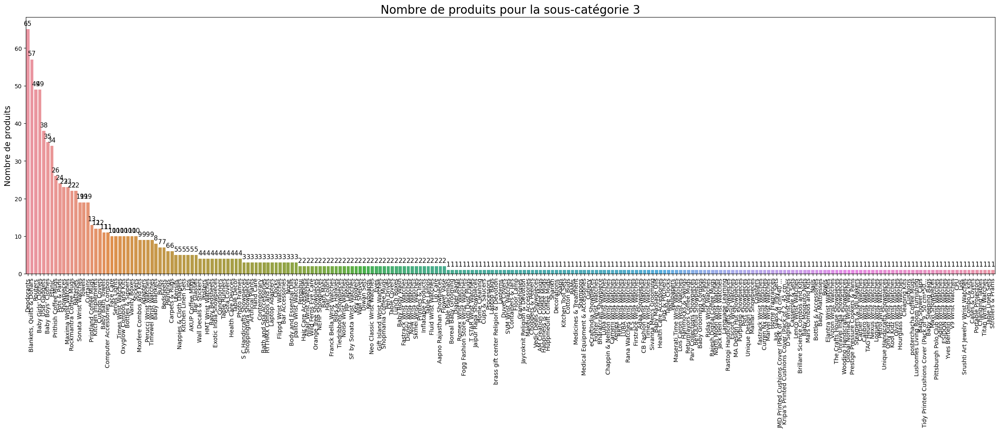

In [20]:
#le comptage de la sous catégorie 3
plt.figure(figsize=(30, 8))
    
plt.xticks(rotation=90)

val = df["categ_3"].value_counts()
val = pd.DataFrame(val)

sns.barplot(x=val.index, y=val["categ_3"])

plt.ylabel("Nombre de produits", size=14)
plt.title("Nombre de produits pour la sous-catégorie 3", size=20)

for i, v in enumerate(val["categ_3"].values):
    plt.text(i, v+1, v, color='black', ha='center', size=11)

### Prétraitement de texte

- description 

In [21]:
df[["description"]].head()

,description
0,Key Features of Elegance Polyester Multicolor ...
1,Specifications of Sathiyas Cotton Bath Towel (...
2,Key Features of Eurospa Cotton Terry Face Towe...
3,Key Features of SANTOSH ROYAL FASHION Cotton P...
4,Key Features of Jaipur Print Cotton Floral Kin...


- Importez les bibliothèques nécessaires 

In [22]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

- Nettoyage du texte - Stopwords - Ponctuation, et Lemmatisation

In [23]:
# Initialisez le Lemmatizer et les Stopwords
lemmatizer = WordNetLemmatizer()
nltk.download('stopwords')
nltk_stopwords = set(stopwords.words('english'))

# Définissez une fonction pour nettoyer la description de chaque produit
def clean_text(text):
    # Convertir le texte en minuscules
    text = text.lower()
    # Supprimer la ponctuation
    text = re.sub(r'[^\w\s]', '', text)
    # Supprimer les stopwords
    text = ' '.join([word for word in text.split() if word not in nltk_stopwords])
    # Lematizer les mots
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split()])
    return text

# Appliquez la fonction de nettoyage à la colonne "description"
df['description'] = df['description'].apply(clean_text)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/sbeddyy/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


- Réalisez le bag of words en utilisant CountVectorizer :

In [24]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Créez un objet CountVectorizer
cv = CountVectorizer(stop_words='english', min_df=5)

# Transformez le texte en sac de mots
bow = cv.fit_transform(df['description'])

# Convertissez le résultat en un DataFrame
bow_df = pd.DataFrame(bow.toarray(), columns=cv.get_feature_names_out())

In [25]:
bow_df

,00,10,100,11,12,121,1299,13,14,141,...,wood,wooden,work,working,world,wrap,year,yellow,yes,youre
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,1,0
2,0,1,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1046,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1047,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1048,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


- Réalisez le bag of words en utilisant TfidfVectorizer :

In [26]:
# Initialisez le TfidfVectorizer
tfidf = TfidfVectorizer(min_df=5)

# Transformez la colonne "description" en bag of words pondéré
tfidf_bow = tfidf.fit_transform(df['description'])

# Convertissez le résultat en un DataFrame
tfidf_bow_df = pd.DataFrame(tfidf_bow.toarray(), columns=tfidf.get_feature_names_out())

In [27]:
tfidf_bow_df

,00,10,100,11,12,121,1299,13,14,141,...,work,working,world,would,wrap,year,yellow,yes,yet,youre
0,0.0,0.000000,0.047756,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.066272,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0
1,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.195524,0.075373,0.0,0.0
2,0.0,0.050538,0.088873,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.047073,0.000000,0.000000,0.0,0.0
3,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.044893,0.0,0.0
4,0.0,0.000000,0.081164,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.037008,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0
1046,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.121917,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0
1047,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0
1048,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0


### ACP

- Pour bag of words en utilisant TfidfVectorizer :

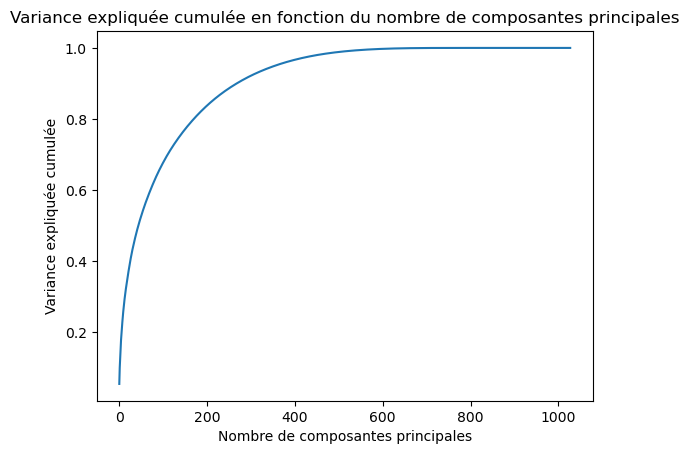

In [28]:
from sklearn.decomposition import TruncatedSVD

# Calculer la variance expliquée cumulée en fonction du nombre de composantes principales
svd = TruncatedSVD(n_components=tfidf_bow_df.shape[1]-1, random_state=42)
svd.fit(tfidf_bow_df)
cumulative_var_exp = np.cumsum(svd.explained_variance_ratio_)

# graphique de la variance expliquée cumulée en fonction du nombre de composantes principales
plt.plot(cumulative_var_exp)
plt.xlabel("Nombre de composantes principales")
plt.ylabel("Variance expliquée cumulée")
plt.title("Variance expliquée cumulée en fonction du nombre de composantes principales")
plt.show()

In [29]:
from sklearn.decomposition import TruncatedSVD


# Appliquer la décomposition de matrice en utilisant l'ACP
svd = TruncatedSVD(n_components=200) # choisissez le nombre de composantes à garder
tfidf_bow_df_reduced = svd.fit_transform(tfidf_bow_df)

# Convertir la matrice réduite en dataframe pandas
columns = ["component_" + str(i+1) for i in range(svd.n_components)]
tfidf_bow_df_reduced = pd.DataFrame(tfidf_bow_df_reduced, columns=columns)

# Afficher les dimensions de la matrice réduite
print("Dimensions de la matrice réduite : ", tfidf_bow_df_reduced.shape)

Dimensions de la matrice réduite :  (1050, 200)


In [30]:
tfidf_bow_df_reduced

,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,...,component_191,component_192,component_193,component_194,component_195,component_196,component_197,component_198,component_199,component_200
0,0.043369,-0.040571,0.210058,-0.006497,0.098999,0.274804,-0.031294,-0.036056,-0.033898,-0.106408,...,-0.038565,0.010295,-0.023811,0.004979,-0.002382,-0.002896,0.022271,-0.033951,-0.057267,-0.042998
1,0.080838,-0.004048,0.279273,-0.135333,-0.048252,0.225998,-0.082771,-0.091588,-0.044877,0.639484,...,0.018978,-0.002603,-0.012931,0.032767,0.025552,0.005941,0.011138,-0.027628,-0.048719,0.017306
2,0.094060,-0.052013,0.257371,-0.123795,-0.051161,0.194340,0.029701,-0.143940,-0.073713,0.540918,...,-0.034410,-0.023154,0.025690,0.096413,-0.044121,0.031362,0.005223,0.076896,-0.085153,0.039302
3,0.049273,-0.043935,0.268632,-0.064861,0.196101,0.224497,-0.052262,-0.078550,-0.025982,0.002638,...,-0.028123,0.001242,0.023460,-0.013416,0.015730,0.037965,0.017655,0.018857,-0.042320,-0.027010
4,0.051310,-0.048081,0.260352,-0.055430,0.163437,0.246233,-0.037395,-0.049304,-0.014140,0.013145,...,-0.020764,0.001484,-0.040033,-0.005224,-0.060840,0.023030,0.008506,0.002873,0.006940,0.023336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.021626,-0.014336,0.065710,0.015636,0.052866,0.078490,0.027217,0.007682,0.004228,0.001011,...,0.009557,-0.030929,0.030344,0.043893,-0.020214,0.091247,0.024029,0.000291,-0.067825,0.005086
1046,0.044687,-0.030729,0.124038,0.061793,0.050398,0.113222,0.043790,0.026324,0.014858,0.013688,...,0.015226,-0.035555,0.052089,-0.020253,-0.099387,-0.032045,0.047504,0.028675,-0.031965,-0.002784
1047,0.262626,-0.092608,-0.007593,0.032005,0.080582,-0.066548,-0.005698,0.061374,0.019227,0.018887,...,-0.011299,-0.051396,-0.050866,-0.067249,-0.018307,0.028102,0.086745,-0.066858,0.007101,-0.072124
1048,0.195902,-0.073318,0.002890,0.026310,0.073014,-0.040480,0.006382,0.056781,0.019174,0.021149,...,-0.031942,0.009538,-0.005654,0.023772,-0.014153,0.000064,-0.017088,-0.009004,0.004930,0.003530


- Pour bag of words en utilisant CountVectorizer :

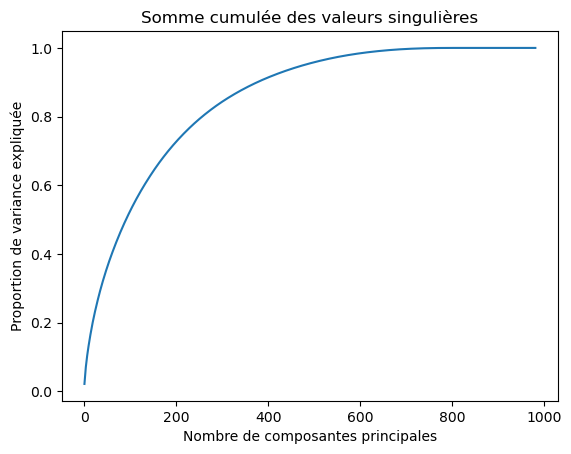

In [31]:
from sklearn.decomposition import TruncatedSVD

# Calculer les valeurs singulières de la matrice
u, s, vt = np.linalg.svd(bow_df)

# Calculer la somme cumulée des valeurs singulières
cumulative_sum = np.cumsum(s)

# Normaliser la somme cumulée pour obtenir les proportions
proportions = cumulative_sum / cumulative_sum[-1]

# Tracer le graphique de la somme cumulée des valeurs singulières
plt.plot(proportions)
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Proportion de variance expliquée')
plt.title('Somme cumulée des valeurs singulières')
plt.show()

In [32]:
from sklearn.decomposition import TruncatedSVD
import pandas as pd

# Appliquer la décomposition de matrice en utilisant l'ACP
svd = TruncatedSVD(n_components=200) # choisissez le nombre de composantes à garder
bow_df_reduced = svd.fit_transform(bow_df)

# Convertir la matrice réduite en dataframe pandas
columns = ["component_" + str(i+1) for i in range(svd.n_components)]
bow_df_reduced = pd.DataFrame(bow_df_reduced, columns=columns)

# Afficher les dimensions de la matrice réduite
print("Dimensions de la matrice réduite : ", bow_df_reduced.shape)

Dimensions de la matrice réduite :  (1050, 200)


### LDA

In [33]:
from sklearn.decomposition import LatentDirichletAllocation
n_topics = 20

# Créer le modèle LDA
lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

# Fitter sur les données
lda.fit(tfidf_bow_df)

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=20, random_state=0)

In [34]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic {}:".format(topic_idx))
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))


no_top_words = 10
display_topics(lda, tfidf.get_feature_names_out(), no_top_words)

Topic 0:
table cm lamp plastic number cover handcrafted glass boy mini
Topic 1:
shade showpiece pair black delivery cm genuine printland copper na
Topic 2:
mug coffee perfect printland ceramic one get bring also gift
Topic 3:
beautifully crafted aluminium metal painted laptop watch adapter power handmade
Topic 4:
cutter brass wheel pizza antique steel pack 199 price kadhai
Topic 5:
set mug yes box bottle gift safe pizza warranty exotic
Topic 6:
duvet sapatos pizza utmost cutter exquisite ensure crafted beautifully bed
Topic 7:
cm showpiece skin product laptop free delivery cash genuine shipping
Topic 8:
rockmantra mug yellow detail printed standard thrilling ensuring 12 ceramic
Topic 9:
warranty adapter power laptop battery charger covered light vaio usb
Topic 10:
blanket digital copper boy warm surface bodysuit india huge month
Topic 11:
decorative bowl 18 plant inch mug wash home showpiece handcrafted
Topic 12:
mug krishna belt price 40 ceramic control thrilling stand making
Topic 13

### NMF

In [35]:
from sklearn.decomposition import NMF
no_topics = 20

#NMF
nmf = NMF(n_components=no_topics, random_state=1, l1_ratio=.5, init='nndsvd')
nmf.fit(bow_df)

no_top_words = 10
display_topics(nmf, cv.get_feature_names_out(), no_top_words)

Topic 0:
cm showpiece home brass price ganesha idol lord gold gift
Topic 1:
mug bring coffee perfect design quality make happy special love
Topic 2:
shipping genuine cash free delivery buy product 30 day replacement
Topic 3:
adapter warranty vaio replacement power laptop smartpro charger product designed
Topic 4:
laptop skin shape mouse print pad warranty inch multicolor combo
Topic 5:
baby girl fabric cotton dress boy sleeve neck ideal pattern
Topic 6:
ceramic mug rockmantra design come safe feature day gift material
Topic 7:
battery quality lapguard laptop replacement cell including label high durability
Topic 8:
cm sheet bedsheet cover cotton pillow double inch flat length
Topic 9:
watch analog men india great discount woman dial strap boy
Topic 10:
product bed color warranty king check dimension type quality mm
Topic 11:
art inch canvas 15 print quality high collection beautiful artist
Topic 12:
usb light power flexible led fan keyboard port portable price
Topic 13:
mug ceramic cof

### TSNE

- Pour bag of words en utilisant CountVectorizer 

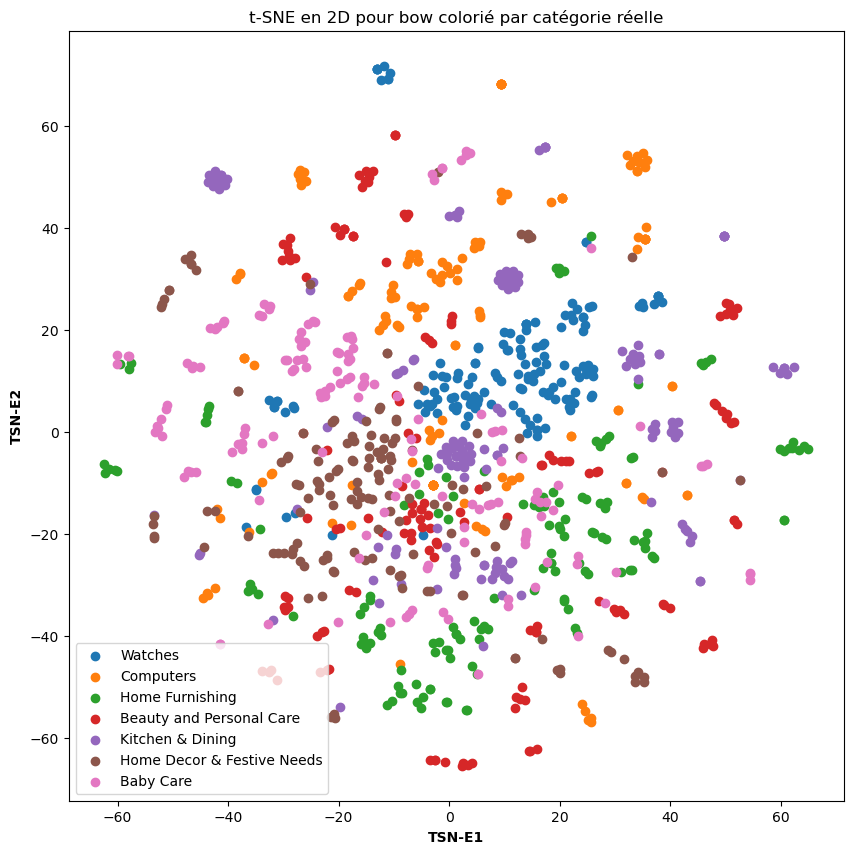

In [36]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

labels=df["categ_1"]
scaler = StandardScaler()
normalized_data1 = scaler.fit_transform(tfidf_bow_df_reduced)

tsne1 = TSNE(n_components=2, random_state=42)
tsne_data1 = tsne1.fit_transform(normalized_data1)

plt.figure(figsize=(10, 10))
for label in set(labels):
    x = tsne_data1[labels == label, 0]
    y = tsne_data1[labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("t-SNE en 2D pour bow colorié par catégorie réelle")
plt.xlabel('TSN-E1', fontweight = 'bold')
plt.ylabel('TSN-E2', fontweight = 'bold')
plt.show()

- Pour bag of words en utilisant TfidfVectorizer :

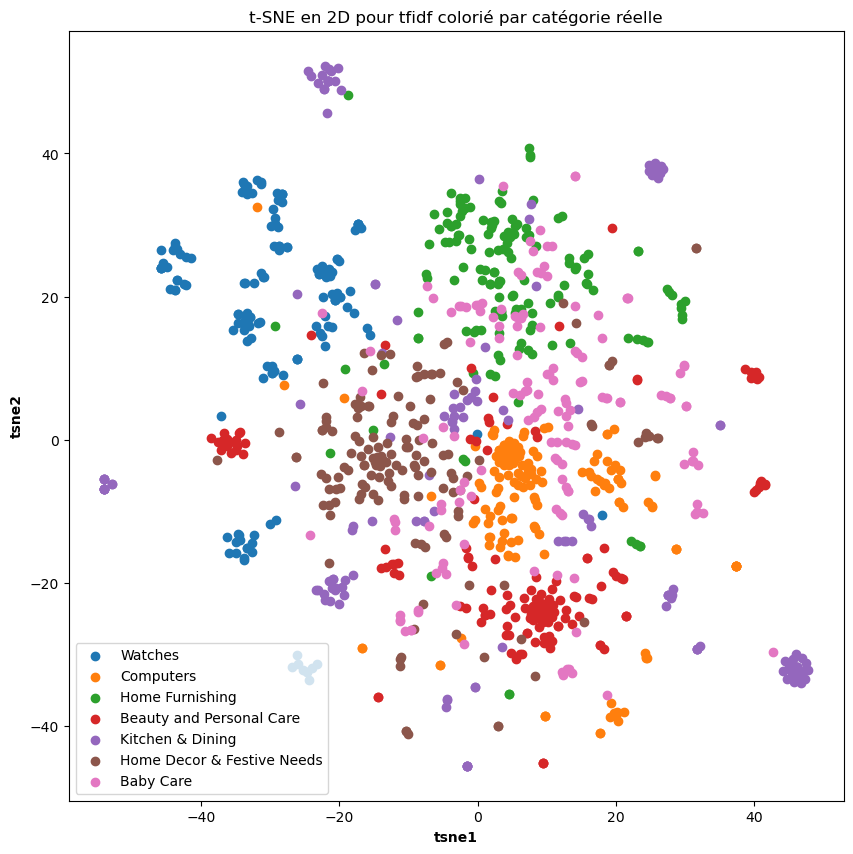

In [37]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

labels=df["categ_1"]
scaler = StandardScaler()
normalized_data2 = scaler.fit_transform(bow_df_reduced)

tsne2 = TSNE(n_components=2, random_state=42)
tsne_data2 = tsne2.fit_transform(normalized_data2)

plt.figure(figsize=(10, 10))
for label in set(labels):
    x = tsne_data2[labels == label, 0]
    y = tsne_data2[labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("t-SNE en 2D pour tfidf colorié par catégorie réelle")
plt.xlabel('tsne1', fontweight = 'bold')
plt.ylabel('tsne2', fontweight = 'bold')
plt.show()

#### Représentation des données selon les Clusters avec K-Means

In [38]:
from sklearn.cluster import KMeans

#KMeans avec 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42)

#le clustering sur les données réduites en dimensionnalité
cluster_labels = kmeans.fit_predict(tsne_data1)

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


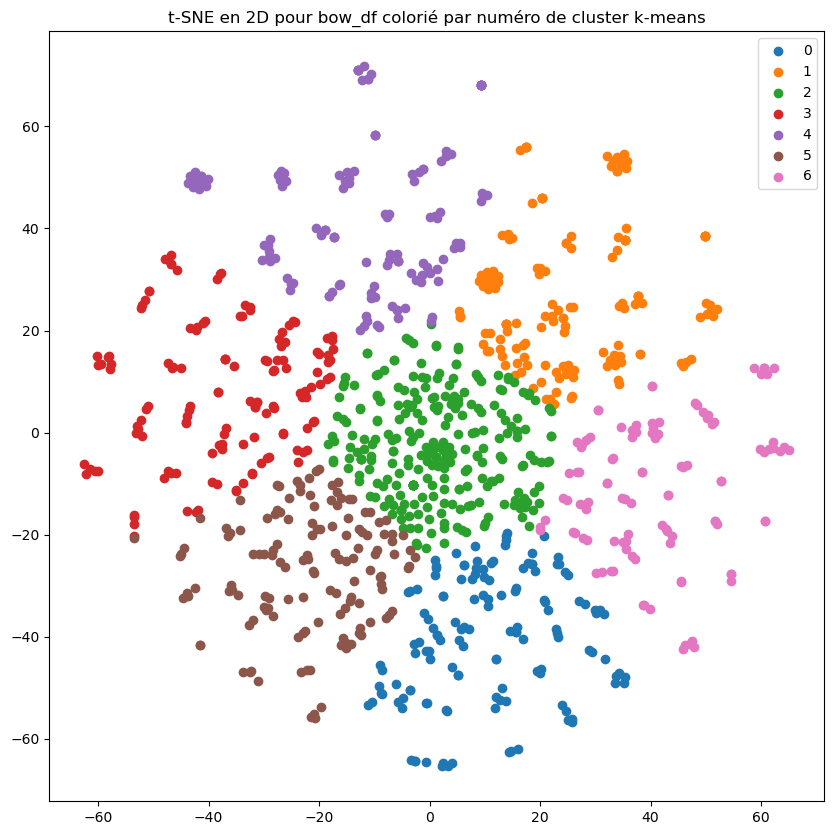

Adjusted Rand Score (ARI) : 0.10


In [39]:
from sklearn.metrics import adjusted_rand_score
plt.figure(figsize=(10, 10))
for label in set(cluster_labels):
    x = tsne_data1[cluster_labels == label, 0]
    y = tsne_data1[cluster_labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("t-SNE en 2D pour bow_df colorié par numéro de cluster k-means")
plt.show()

# Calculer l'ARI entre les catégories réelles et les clusters k-means
ari1 = adjusted_rand_score(labels, cluster_labels)
print("Adjusted Rand Score (ARI) : {:.2f}".format(ari1))

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


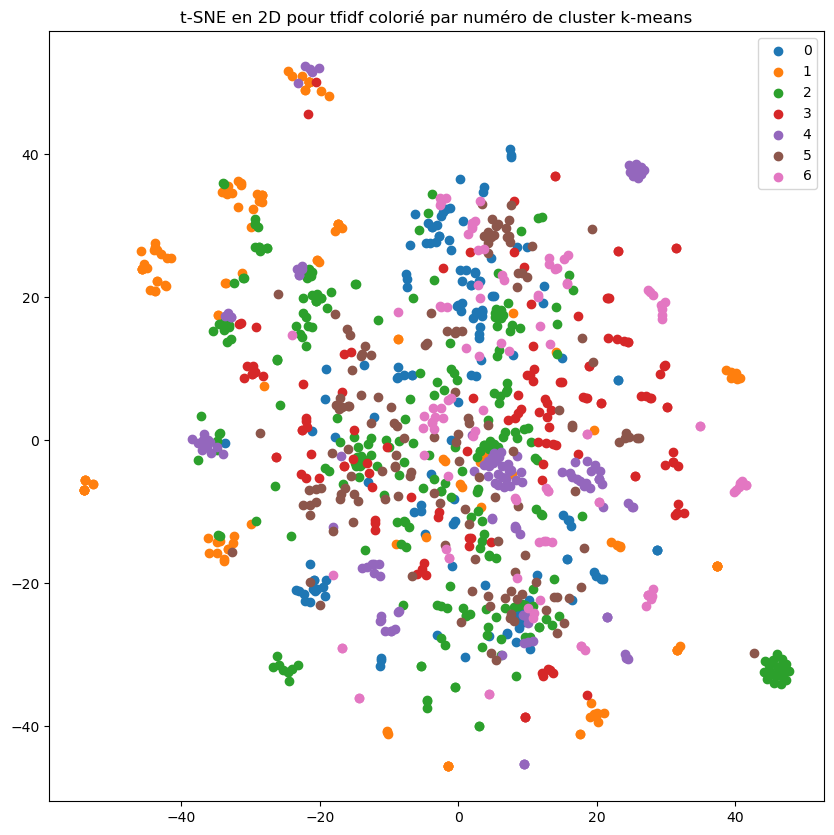

Adjusted Rand Score (ARI) : 0.28


In [40]:
#le clustering sur les données réduites en dimensionnalité
cluster_labels2 = kmeans.fit_predict(tsne_data2)

plt.figure(figsize=(10, 10))
for label in set(cluster_labels):
    x = tsne_data2[cluster_labels == label, 0]
    y = tsne_data2[cluster_labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("t-SNE en 2D pour tfidf colorié par numéro de cluster k-means")
plt.show()

# Calculer l'ARI entre les catégories réelles et les clusters k-means
ari2 = adjusted_rand_score(labels, cluster_labels2)
print("Adjusted Rand Score (ARI) : {:.2f}".format(ari2))

###  Embedding avec:

 - Word2Vec

In [41]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

2023-05-24 17:52:23.382397: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [42]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 24 # adapt to length of sentences
sentences = df['description'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [43]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4934
Word2Vec trained


In [44]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4935


In [45]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4935, 300)


In [46]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding (Embedding)       (None, 24, 300)           1480500   
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 1,480,500
Trainable params: 1,480,500
Non-trainable params: 0
_________________________________________________________________


2023-05-24 17:52:43.044738: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [47]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 466us/step


(1050, 300)

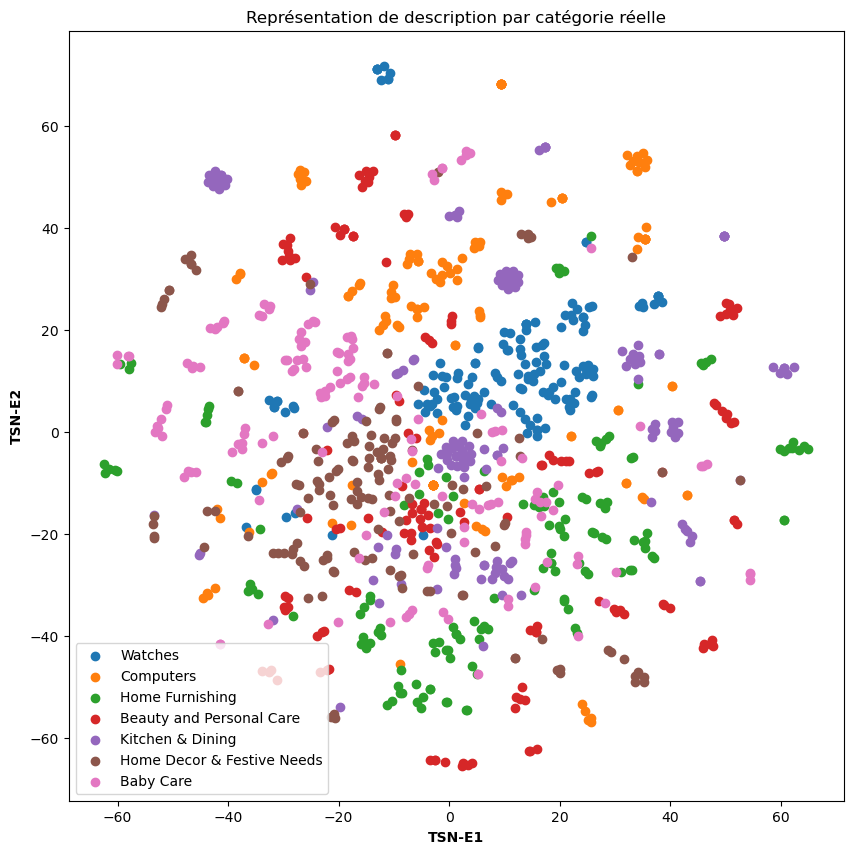

In [48]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

labels=df["categ_1"]
scaler = StandardScaler()
Normalized_data = scaler.fit_transform(embeddings)

Tsne = TSNE(n_components=2, random_state=42)
TSNE_df = Tsne.fit_transform(Normalized_data)

plt.figure(figsize=(10, 10))
for label in set(labels):
    x = tsne_data1[labels == label, 0]
    y = tsne_data1[labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("Représentation de description par catégorie réelle")
plt.xlabel('TSN-E1', fontweight = 'bold')
plt.ylabel('TSN-E2', fontweight = 'bold')
plt.show()

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


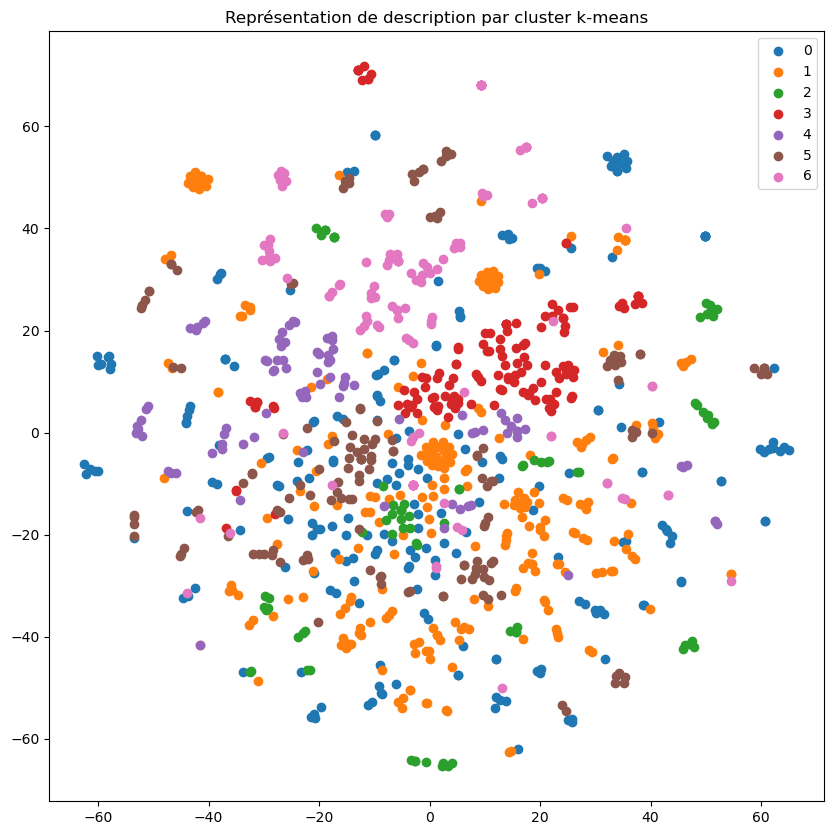

(ARI) : 0.31


In [49]:
#KMeans avec 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42)

#le clustering sur les données réduites en dimensionnalité
cluster_labels = kmeans.fit_predict(TSNE_df)

plt.figure(figsize=(10, 10))
for label in set(cluster_labels):
    x = tsne_data1[cluster_labels == label, 0]
    y = tsne_data1[cluster_labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("Représentation de description par cluster k-means")
plt.show()

# Calculer l'ARI entre les catégories réelles et les clusters k-means
ARI = adjusted_rand_score(labels, cluster_labels)
print("(ARI) : {:.2f}".format(ARI))

- BERT : Bert-base-uncased

In [50]:
# Bert
import os
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [51]:
from transformers import BertTokenizer, TFBertModel

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model = TFBertModel.from_pretrained("bert-base-uncased")

loading file vocab.txt from cache at /Users/sbeddyy/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/vocab.txt
loading file added_tokens.json from cache at None
loading file special_tokens_map.json from cache at None
loading file tokenizer_config.json from cache at /Users/sbeddyy/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/tokenizer_config.json
loading configuration file config.json from cache at /Users/sbeddyy/.cache/huggingface/hub/models--bert-base-uncased/snapshots/0a6aa9128b6194f4f3c4db429b6cb4891cdb421b/config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_

In [52]:
# Fonction pour encoder les descriptions de produits en utilisant le tokenizer BERT
def encode_text(texts, tokenizer, max_len=512):
    input_ids = []
    attention_masks = []

    for text in texts:
        encoded = tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=max_len,
            pad_to_max_length=True,
            return_attention_mask=True
        )

        input_ids.append(encoded['input_ids'])
        attention_masks.append(encoded['attention_mask'])

    return np.array(input_ids), np.array(attention_masks)

# Encodage des descriptions de produits
X_ids, X_masks = encode_text(df["description"], tokenizer)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:2304: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [53]:
# Préparer les données
texts = df['description'].values
tokenized_texts = [tokenizer.tokenize(text) for text in texts]
input_ids = [tokenizer.convert_tokens_to_ids(tokens) for tokens in tokenized_texts]
input_ids = [tokenizer.build_inputs_with_special_tokens(ids) for ids in input_ids]
max_length = 128
input_ids = pad_sequences(input_ids, maxlen=max_length, dtype="long", value=0, truncating="post", padding="post")
attention_masks = [[int(i>0) for i in ii] for ii in input_ids]

In [54]:
# Encoder les données en utilisant BERT
input_ids = tf.convert_to_tensor(input_ids)

In [55]:
attention_masks = tf.convert_to_tensor(attention_masks)

In [56]:
outputs = model([input_ids, attention_masks])

In [57]:
# Extraire les embeddings de phrases
sentence_embeddings = outputs[1].numpy()

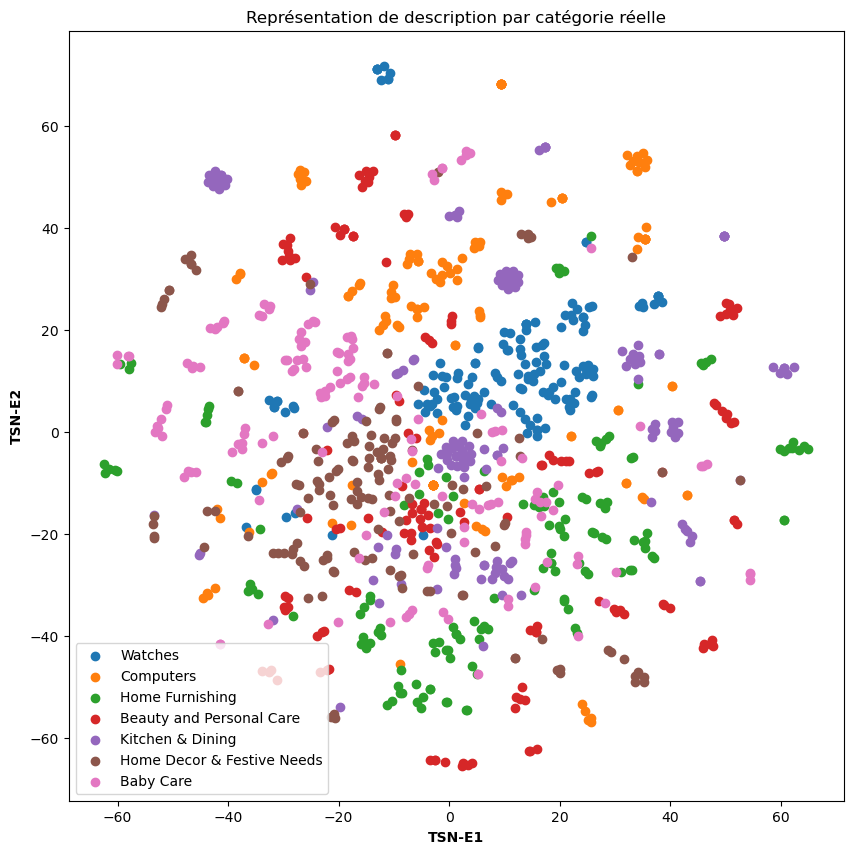

In [58]:
from sklearn.manifold import TSNE

labels=df["categ_1"]
scaler = StandardScaler()
normalization = scaler.fit_transform(sentence_embeddings)

TsnE = TSNE(n_components=2, random_state=0)
tsne_result = TsnE.fit_transform(normalization)

plt.figure(figsize=(10, 10))
for label in set(labels):
    x = tsne_data1[labels == label, 0]
    y = tsne_data1[labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("Représentation de description par catégorie réelle")
plt.xlabel('TSN-E1', fontweight = 'bold')
plt.ylabel('TSN-E2', fontweight = 'bold')
plt.show()

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


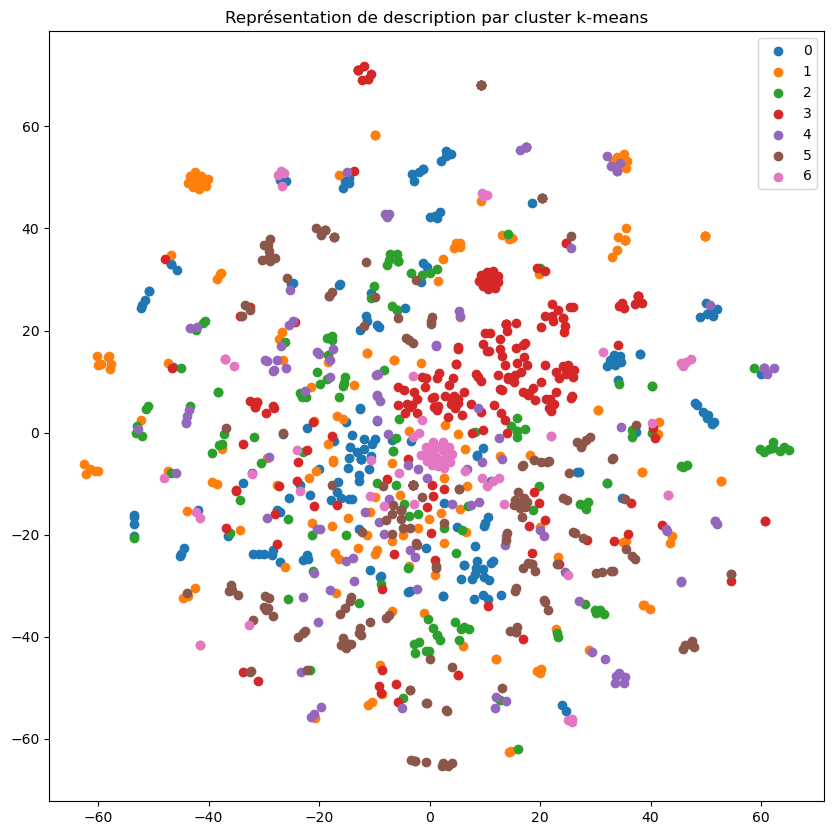

(ARI) : 0.19


In [59]:
#KMeans avec 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42)

#le clustering sur les données réduites en dimensionnalité
cluster_labels = kmeans.fit_predict(tsne_result)

plt.figure(figsize=(10, 10))
for label in set(cluster_labels):
    x = tsne_data1[cluster_labels == label, 0]
    y = tsne_data1[cluster_labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("Représentation de description par cluster k-means")
plt.show()

# Calculer l'ARI entre les catégories réelles et les clusters k-means
ARI = adjusted_rand_score(labels, cluster_labels)
print("(ARI) : {:.2f}".format(ARI))

- USE

In [60]:
import tensorflow_hub as hub
import tensorflow as tf

# charger le modèle Universal Sentence Encoder
module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"
model = hub.load(module_url)

# utiliser le modèle pour encoder les descriptions en vecteurs
def embed(text):
    return model([text])[0]

# Appliquer la fonction embed() sur la colonne 'description' pour obtenir les vecteurs d'embedding
embedded_vectors = df['description'].apply(embed).tolist()

In [61]:
embedded_vectors

[<tf.Tensor: shape=(512,), dtype=float32, numpy=
 array([-0.05473427, -0.05485449,  0.04470382,  0.05223393,  0.0142159 ,
         0.05178762, -0.03914388,  0.04780285, -0.03298894, -0.01571864,
        -0.05392795, -0.03375297,  0.02777717, -0.05511113,  0.02129716,
         0.0543994 ,  0.05430655,  0.04353235,  0.05480424,  0.04018325,
        -0.04260263, -0.05100825,  0.02512178, -0.05296368, -0.05250496,
        -0.04898088,  0.05207212,  0.05270952,  0.05407272,  0.04780941,
         0.05515768, -0.0068786 ,  0.0435609 , -0.04903089,  0.052774  ,
         0.0046016 ,  0.05431243,  0.05514769, -0.05320347, -0.05501331,
        -0.04042631, -0.04833971,  0.05305905,  0.04110508,  0.01646296,
        -0.05511285,  0.05256771, -0.00971132,  0.04458377, -0.03367648,
        -0.02464124,  0.05070365, -0.05515766, -0.05501424, -0.01784169,
         0.04285047,  0.0543719 ,  0.05436106, -0.0488844 , -0.05487695,
        -0.05137102, -0.05502149,  0.05232618,  0.04808488,  0.05423572,
  

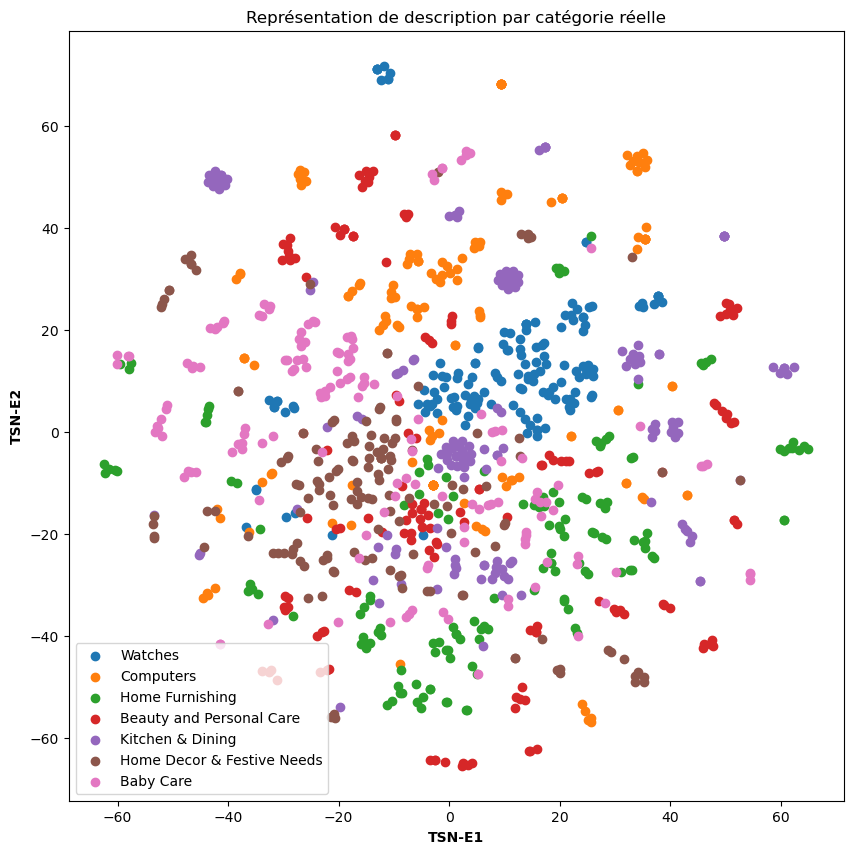

In [62]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

labels=df["categ_1"]
scaler = StandardScaler()
norm = scaler.fit_transform(embedded_vectors)

Tsne = TSNE(n_components=2, random_state=42)
TSn_vec = Tsne.fit_transform(norm)

plt.figure(figsize=(10, 10))
for label in set(labels):
    x = tsne_data1[labels == label, 0]
    y = tsne_data1[labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("Représentation de description par catégorie réelle")
plt.xlabel('TSN-E1', fontweight = 'bold')
plt.ylabel('TSN-E2', fontweight = 'bold')
plt.show()

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


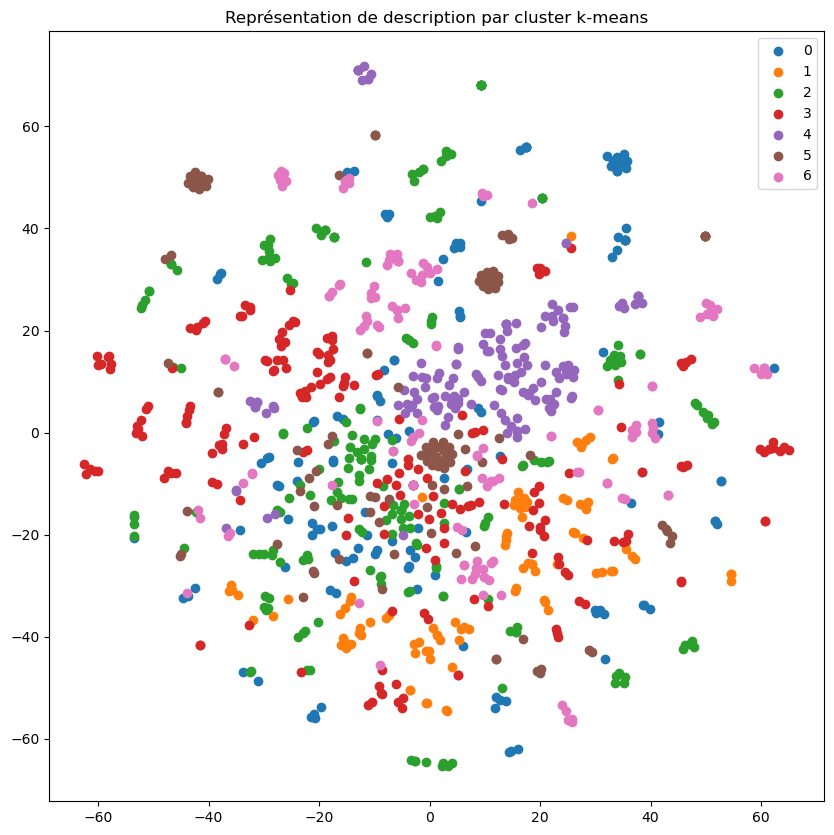

(ARI) : 0.39


In [63]:
#KMeans avec 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42)

#le clustering sur les données réduites en dimensionnalité
cluster_labels = kmeans.fit_predict(TSn_vec)

plt.figure(figsize=(10, 10))
for label in set(cluster_labels):
    x = tsne_data1[cluster_labels == label, 0]
    y = tsne_data1[cluster_labels == label, 1]
    plt.scatter(x, y, label=label)
plt.legend()
plt.title("Représentation de description par cluster k-means")
plt.show()

# Calculer l'ARI entre les catégories réelles et les clusters k-means
ARI = adjusted_rand_score(labels, cluster_labels)
print("(ARI) : {:.2f}".format(ARI))

## Conclusion:

In [64]:
result = {'modèle': ['BOW', 'TF-IDF', 'Word2Vec', 'BERT', 'USE'],
        'ARI': [0.10, 0.28, 0.31, 0.18, 0.39]}

df = pd.DataFrame(result)

print(df)

     modèle   ARI
0       BOW  0.10
1    TF-IDF  0.28
2  Word2Vec  0.31
3      BERT  0.18
4       USE  0.39


En se basant sur les résultats présentés de ARI :

- Le modèle USE (Universal Sentence Encoder) obtient le score le plus élevé d'Index de Randonnée Ajusté (ARI) avec une valeur de 0.39, indiquant une performance relativement meilleure par rapport aux autres modèles.
- Le modèle Word2Vec obtient le deuxième meilleur score d'ARI avec une valeur de 0.31, montrant une performance solide dans la tâche considérée.
- Les modèles BOW (Bag-of-Words), TF-IDF et BERT ont des scores d'ARI inférieurs, avec des valeurs de 0.10, 0.28 et 0.18 respectivement.

En conclusion, ces résultats indiquent que le modèle USE a la meilleure performance parmi les modèles évalués, suivi par le modèle Word2Vec. Les modèles BOW, TF-IDF et BERT présentent des performances plus faibles dans cette évaluation.